In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov5-SI2
!ls

Mounted at /content/gdrive
/content/gdrive/My Drive/yolov5-SI2
benchmarks.py	     export.py	       segment	       val.py
classify	     hubconf.py        setup.cfg       yolov5.ipynb
CONTRIBUTING.md      LICENSE	       si.yaml	       yolov5m.pt
data		     models	       test	       yolov5-SI2.ipynb
datasets	     __pycache__       test.py	       yolov5s.pt
detect_calculate.py  README.md	       train.py        yolov5x.pt
detect.py	     requirements.txt  tutorial.ipynb
detect_thonny.py     runs	       utils


In [2]:
%pip install -qr requirements.txt # install dependencies
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.7 MB/s eta 0:00:00
Setup complete. Using torch 1.13.1+cu116 (Tesla T4)


In [ ]:
!python train.py --img 416 --batch 64 --epochs 5000 --patience 0 --data si.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=si.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5000, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=0, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch origin' timed out after 5 seconds
error: object file .git/objects/58/9edc7b012d45a5c8ad6231d7716f88cb6e43ca is empty
error: object file .git/objects/58/9edc7b012d45a5c8ad6231d7716f88cb6e43ca is empty
fatal: loose object 589edc7b012d45a5c8ad6231d7716f88cb6e43ca (stored in .git/objects/58/9edc7b012d45a5c8ad6231d7716f88cb6e43ca) is corrupt
fatal: The remote end hung up unexpectedly
YOLOv5 🚀 v6.2-217

In [ ]:
!python train.py --resume  # automatically find latest checkpoint (searches yolov5/ directory)

Streaming output truncated to the last 5000 lines.
      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  4002/4999        11G   0.004977   0.003369          0        121        416: 100% 17/17 [00:13<00:00,  1.28it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:02<00:00,  1.10s/it]
                   all        250        365        0.9      0.729      0.819      0.437

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  4003/4999        11G   0.004961   0.003355          0        127        416: 100% 17/17 [00:12<00:00,  1.35it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:01<00:00,  1.48it/s]
                   all        250        365      0.902      0.729      0.819      0.438

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  4004/4999        11G   0.004998   0.003409          0  

In [4]:
!python val.py --data si.yaml --weights runs/train/exp/weights/bestsie2.pt --img 416 --iou 0.5 --conf 0.093

val: data=si.yaml, weights=['runs/train/exp/weights/bestsie2.pt'], batch_size=32, imgsz=416, conf_thres=0.093, iou_thres=0.5, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.093 > 0.001 produces invalid results
YOLOv5 🚀 v6.2-217-ga625f299 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning '/content/gdrive/MyDrive/yolov5-SI2/datasets/surgical_instruments/labels/valid.cache' images and labels... 303 found, 0 missing, 15 empty, 0 corrupt: 100% 303/303 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 10/10 [00:12<00:00,  1.22s/it]
                   all        303        390      0.965      0.921      0.95

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.5 --source test/images --exist-ok

detect: weights=['runs/train/exp/weights/best.pt'], source=test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-217-ga625f29 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
101 436 826 682 Instrument
1327 632 1740 915 Instrument
image 1/2 /content/gdrive/MyDrive/yolov5-SI/test/images/test1.jpg: 256x416 2 Instruments, 21.6ms
1186 112 1540 366 Instrument
130 497 879 1022 Instrument
937 409 1771 892 Instrument
image 2/2 /content/gdrive/MyDrive/yolov5-SI/test/images/test2.jpg: 256x416 3 Instruments, 21.5ms
Speed: 0.4ms pre-pr

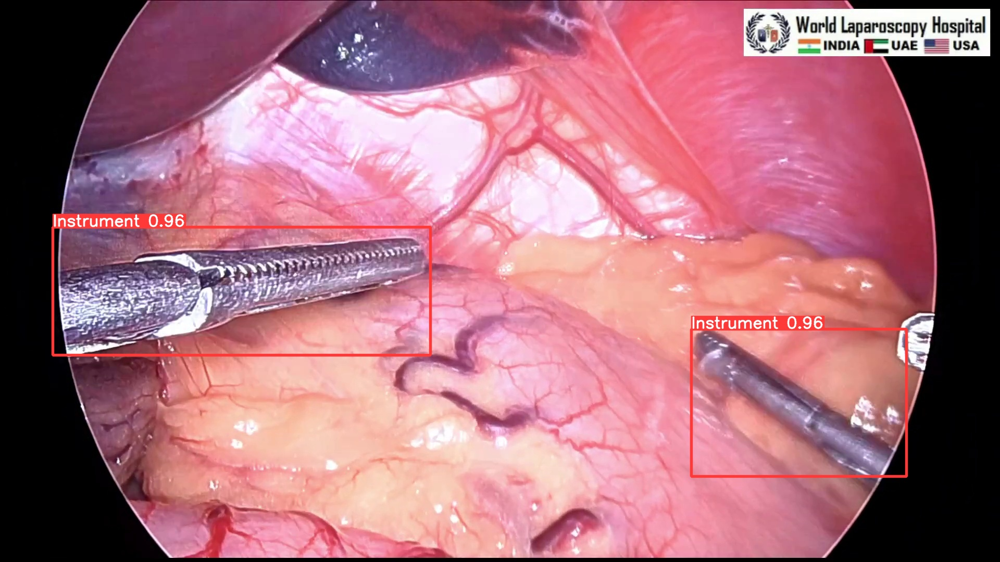

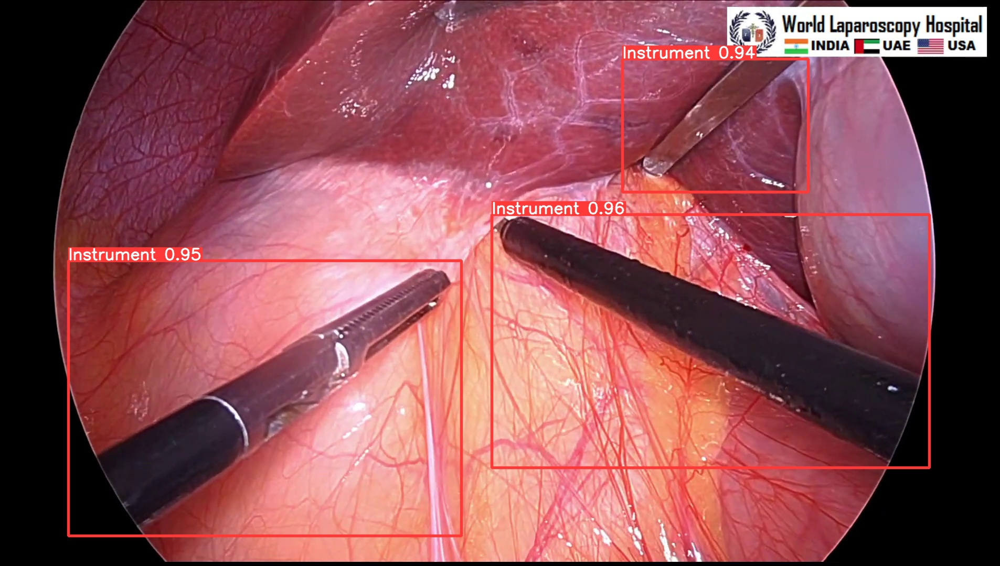

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")